In [1]:
import os
from pathlib import Path

os.environ["NJ_DOMAIN"] = "v3"  # must precede the nj_sfincs import

import sys

ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "nj_sfincs").is_dir())
sys.path.insert(0, str(ROOT))

import pandas as pd
from IPython.display import Image, display

from nj_sfincs import animate, domain, plots

DOM = domain.active()
EXP = ROOT / "experiments" / DOM.name
FIGS = ROOT / "reports" / "figures"

# All three arms. Keys are the panel labels.
RUNS = {
    "naccs-premier": "naccs-premier",
    "wave-stwave": "wave-stwave",
    "naccs-nowaves": "naccs-nowaves",
}

print(DOM.name, "|", sorted(DOM.map_windows))
print({k: (EXP / v / "sfincs_map.nc").exists() for k, v in RUNS.items()})

v3 | ['absecon', 'arthur_kill', 'barnegat', 'cape_may', 'domain', 'great_bay', 'great_egg', 'narrows', 'raritan', 'sandy_hook']
{'naccs-premier': True, 'wave-stwave': True, 'naccs-nowaves': True}


## Water-level boundary — forced cells + NACCS support (all three arms share one boundary; one panel)

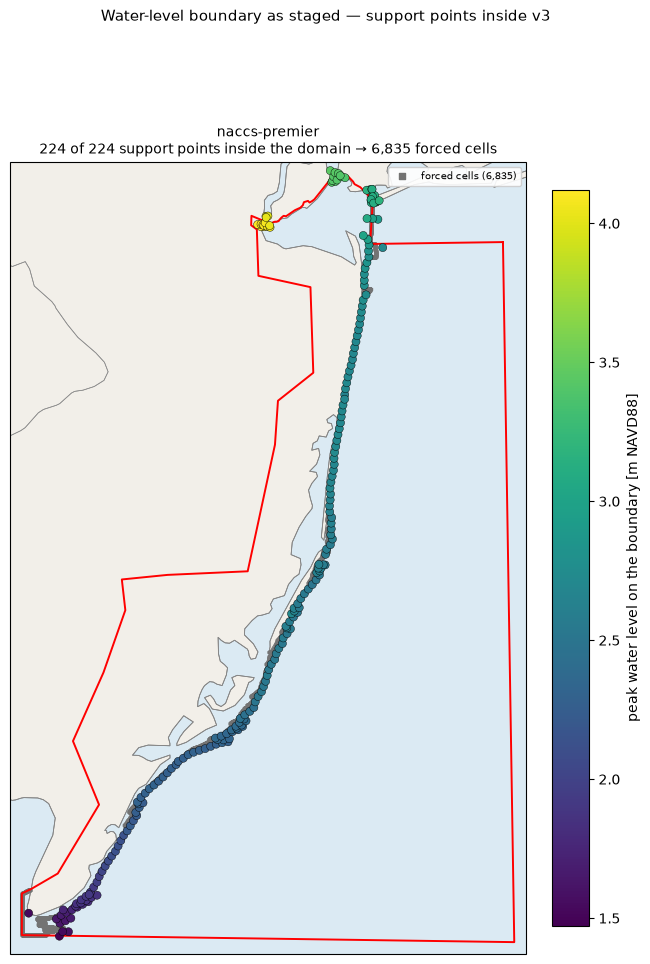

In [2]:
plots.plot_waterlevel_boundary_panels({"naccs-premier": "naccs-premier"}, ncol=1);

## Metrics

In [3]:
csv = EXP / "metrics.csv"
display(
    pd.read_csv(csv).round(3)
    if csv.exists()
    else "no metrics.csv — run: python run_experiments.py --experiments <arm> --validate-only"
)

,Unnamed: 0,peak_zb_sss_great_kills_m,peak_obs_sss_great_kills_m,peak_obs_time_sss_great_kills,peak_mod_full_sss_great_kills_m,peak_mod_full_time_sss_great_kills,peak_err_sss_great_kills_m,peak_lag_sss_great_kills_min,peak_zb_sss_arthur_kill_mouth_m,peak_obs_sss_arthur_kill_mouth_m,...,motf_km2_unsim_motfwet,motf_km2_unsim_modwet,motf_km2_excluded_boxes,motf_km2_fa_connected,motf_km2_fa_disconnected,motf_km2_fa_rainonly,motf_far_connected,motf_csi_connected,domain,extent_admissible
0,naccs-premier,-1.895,3.991,2012-10-30T00:42,3.920,2012-10-30T00:20,-0.071,-22.0,-1.085,3.813,...,3.785,0.004,0.0,7.854,13.505,0.0,0.021,0.855,v3,True
1,naccs-nowaves,-1.895,3.991,2012-10-30T00:42,3.403,2012-10-30T01:00,-0.588,18.0,-1.085,3.813,...,3.785,0.003,0.0,5.676,12.219,0.0,0.016,0.831,v3,False
2,wave-stwave,-1.895,3.991,2012-10-30T00:42,3.396,2012-10-30T00:50,-0.595,8.0,-1.085,3.813,...,3.785,0.003,0.0,7.451,13.543,0.0,0.020,0.856,v3,True


## Gauges — ⚠️ Ship Bottom · Sea Isle · Stone Harbor obs peaks are pre-storm gap artefacts; Absecon Creek reads its own injection; five obs faces sit above MSL and show no tide (STATUS 2026-08-27)

No region component found in components.


No region component found in components.


No region component found in components.


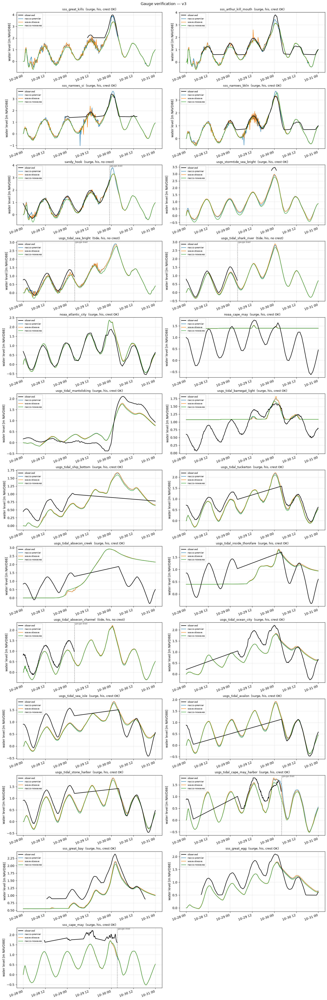

In [4]:
plots.plot_gauge_verification(RUNS);

## Gauge metrics — `tide` gauges: read range/phase. `surge` gauges: read peak.

In [5]:
m = pd.read_csv(EXP / "metrics.csv", index_col=0)

COLS = {
    "peak_obs": "peak_obs_{n}_m",
    "peak_mod": "peak_mod_full_{n}_m",
    "peak_err": "peak_err_{n}_m",
    "peak_lag_min": "peak_lag_{n}_min",
    "tide_obs_rng": "tide_obs_range_{n}_m",
    "tide_mod_rng": "tide_mod_range_{n}_m",
    "tide_damping": "tide_range_damping_{n}_m",
    "phase_lag_min": "phase_lag_{n}_min",
}

rows = []
for arm in m.index:
    for g in DOM.obs_gauges:
        r = {"arm": arm, "gauge": g.name, "kind": g.kind,
             "crest": "survives" if g.survives_crest else "DIED"}
        for label, pat in COLS.items():
            k = pat.format(n=g.name)
            r[label] = m.loc[arm, k] if k in m.columns else float("nan")
        # Sandy Hook died mid-storm: its only admissible peak is the pre-failure one.
        k = f"peak_err_prefail_{g.name}_m"
        if k in m.columns:
            r["peak_err"] = m.loc[arm, k]
            r["crest"] = "DIED (prefail)"
        rows.append(r)

gm = pd.DataFrame(rows).set_index(["gauge", "kind", "crest", "arm"]).round(3)
display(gm)

,,,,peak_obs,peak_mod,peak_err,peak_lag_min,tide_obs_rng,tide_mod_rng,tide_damping,phase_lag_min
gauge,kind,crest,arm,,,,,,,,
sss_great_kills,surge,survives,naccs-premier,3.991,3.920,-0.071,-22.0,0.204,1.932,-1.728,NaN
sss_arthur_kill_mouth,surge,survives,naccs-premier,3.813,3.427,-0.386,-16.0,1.309,1.755,-0.446,5.6
sss_narrows_si,surge,survives,naccs-premier,3.424,3.662,0.239,44.0,0.407,2.843,-2.437,-61.3
sss_narrows_bkln,surge,survives,naccs-premier,3.316,3.688,0.373,16.0,1.035,2.276,-1.241,-120.0
sandy_hook,surge,DIED (prefail),naccs-premier,2.808,3.819,-0.175,NaN,2.029,1.732,0.297,-1.8
...,...,...,...,...,...,...,...,...,...,...,...
usgs_tidal_stone_harbor,surge,survives,wave-stwave,1.551,1.878,0.326,1428.0,1.210,1.138,0.072,-9.4
usgs_tidal_cape_may_harbor,surge,DIED (prefail),wave-stwave,1.798,1.795,-0.003,NaN,1.186,1.404,-0.219,46.7
sss_great_bay,surge,survives,wave-stwave,2.390,2.147,-0.243,10.0,0.401,0.197,0.204,92.4


## HWM

/cache/home/tpj8/nj_sandy_sfincs/micromamba/envs/sfincs/lib/python3.14/site-packages/rioxarray/rioxarray.py:431: UserWarning: Transform that is non-rectilinear or with rotation found. Unable to recalculate.
  warnings.warn(


/cache/home/tpj8/nj_sandy_sfincs/micromamba/envs/sfincs/lib/python3.14/site-packages/rioxarray/rioxarray.py:431: UserWarning: Transform that is non-rectilinear or with rotation found. Unable to recalculate.
  warnings.warn(


[hwm] region clip: 45 of 185 marks are outside the domain region and are NOT scored (they would otherwise score as dry against bare earth)


[hwm] region clip: 45 of 185 marks are outside the domain region and are NOT scored (they would otherwise score as dry against bare earth)


/cache/home/tpj8/nj_sandy_sfincs/micromamba/envs/sfincs/lib/python3.14/site-packages/rioxarray/rioxarray.py:431: UserWarning: Transform that is non-rectilinear or with rotation found. Unable to recalculate.
  warnings.warn(


[hwm] region clip: 45 of 185 marks are outside the domain region and are NOT scored (they would otherwise score as dry against bare earth)


/cache/home/tpj8/nj_sandy_sfincs/micromamba/envs/sfincs/lib/python3.14/site-packages/rioxarray/rioxarray.py:431: UserWarning: Transform that is non-rectilinear or with rotation found. Unable to recalculate.
  warnings.warn(


[hwm] region clip: 45 of 185 marks are outside the domain region and are NOT scored (they would otherwise score as dry against bare earth)


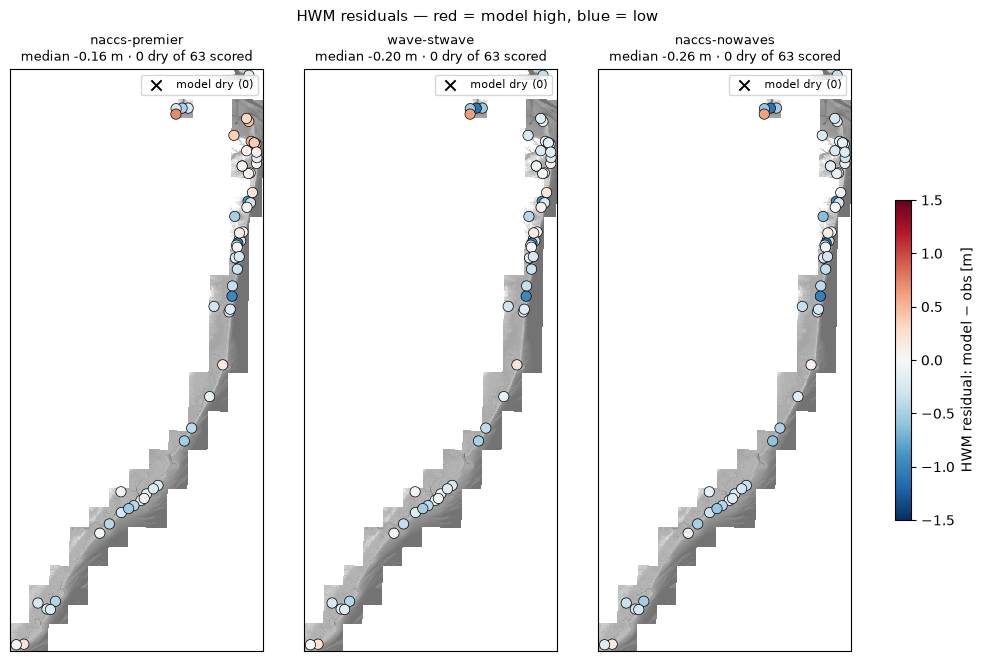

In [6]:
plots.plot_hwm_residual_panels(RUNS, ncol=3);

## MOTF — waves-on arms only · tan FAs were never sea-connected (rain, not surge) · ⚠️ v3 declares no validity exclude boxes yet

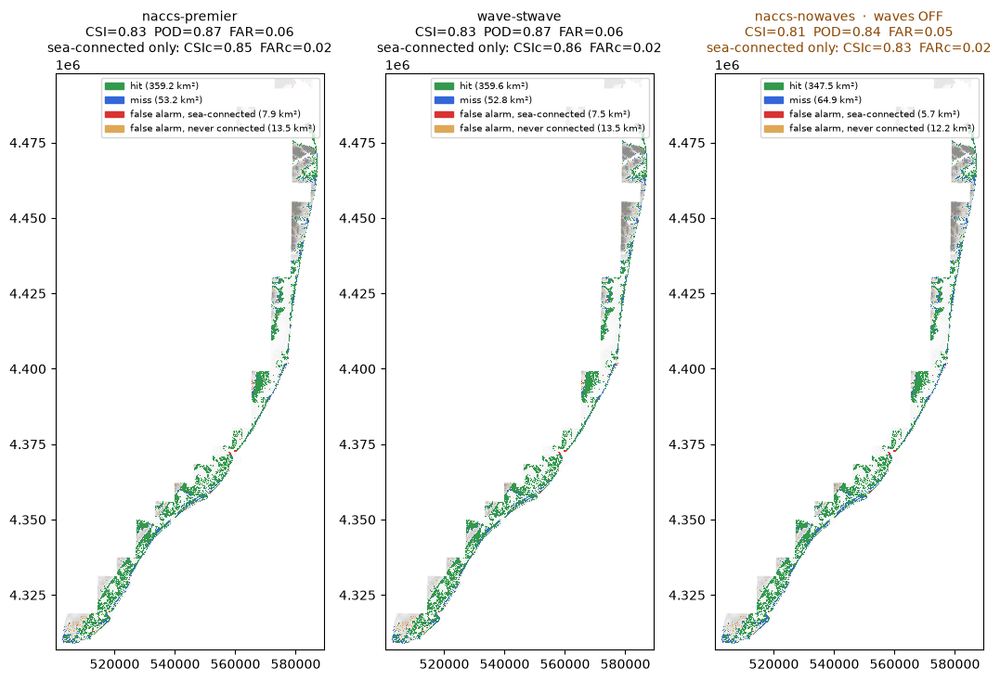

In [7]:
plots.plot_motf_panels(RUNS, ncol=3, split_fa=True);

## Animations

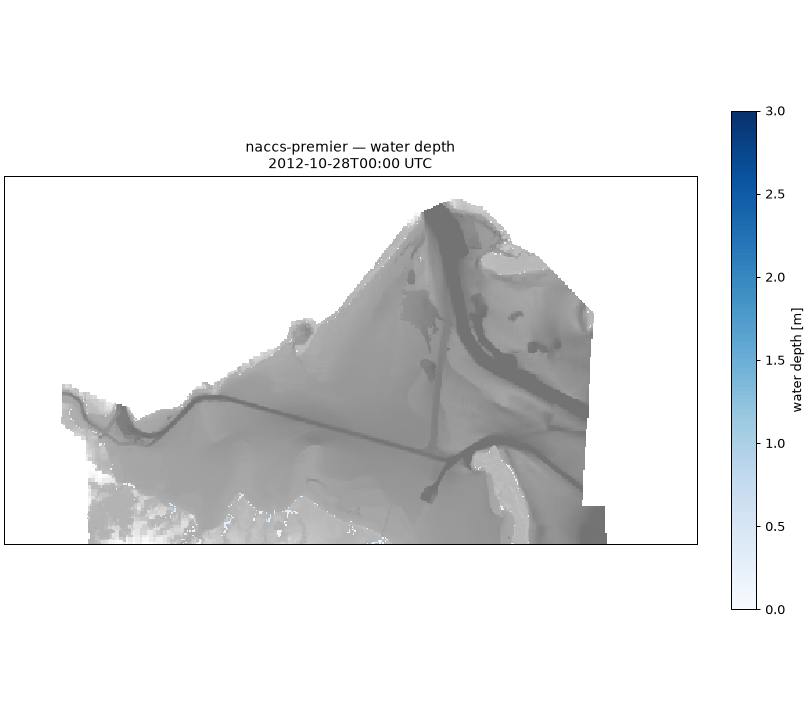

In [8]:
anim = animate.animate_field("naccs-premier", "depth", window="raritan", fps=6)
p = FIGS / "v3_depth_raritan.gif"
anim.save(p, writer="pillow", fps=6, dpi=90)
display(Image(filename=str(p)))

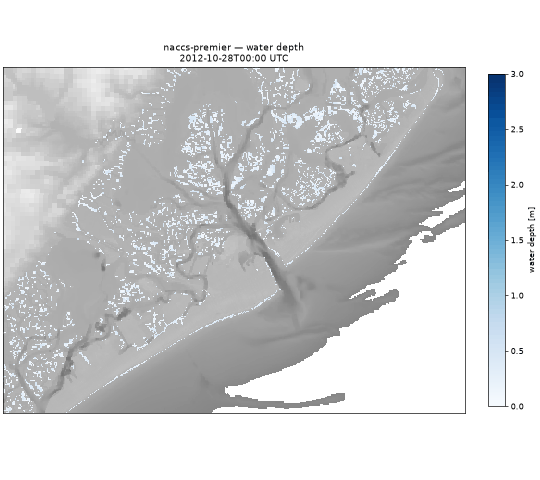

In [9]:
anim = animate.animate_field("naccs-premier", "depth", window="absecon", fps=6)
p = FIGS / "v3_depth_absecon.gif"
anim.save(p, writer="pillow", fps=6, dpi=60)
display(Image(filename=str(p)))

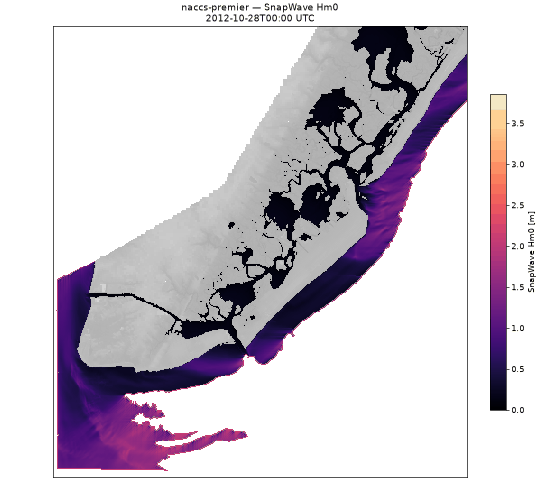

In [10]:
anim = animate.animate_field("naccs-premier", "hm0", window="cape_may", fps=6)
p = FIGS / "v3_hm0_cape_may.gif"
anim.save(p, writer="pillow", fps=6, dpi=60)
display(Image(filename=str(p)))

## Interactive — pick a run, field, window

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
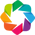

interactive(children=(Dropdown(description='run', options=('naccs-premier', 'wave-stwave', 'naccs-nowaves'), v…

In [11]:
import holoviews as hv
import ipywidgets as widgets

hv.extension("bokeh")


@widgets.interact(
    run=list(RUNS.values()),
    var=["depth", "zs", "hm0", "tp"],
    window=sorted(DOM.map_windows),
)
def browse(run="naccs-premier", var="depth", window="absecon"):
    display(animate.explore_field(run, var=var, window=window))